# Pipeline Describe
- Download Data
- Load Data
- Analyze trend and cycle
- Transform for stationarity

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from pylab import rcParams
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf, adfuller, arma_order_select_ic
from sklearn.model_selection import ParameterGrid
import itertools
import warnings


#Own packages
import download
import descriptive
import models
import model_wrapper

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
warnings.filterwarnings("ignore")

# Params to modify

In [3]:
p = range(2, 4)
q = range(2,4)
sea_p = range(0, 2)
sea_q = range(0, 2)
sea_s = [12]
params = {
    'outcome_col': 'iva_neto_(mdp)_r',
    'pred_start': '2010-01-01',
    'pred_end': '2019-07-01',
    'pred_period': '6MS',
    'transformation': 'log_diff',
    'models':{
        'ARIMA': {'order': [(x[0], 0, x[1]) for x in list(itertools.product(p, q))]},
        'SARIMA': {'order': [(x[0], 0, x[1]) for x in list(itertools.product(p, q))],
                   'seasonal_order': [(x[0], 0, x[1], x[2]) for x in list(itertools.product(sea_p, sea_q, sea_s))],
                   'enforce_stationarity': [False],
                   'enforce_invertibility': [False]},
        'ELASTICITY': {'lag_window': [3, 6], 'elasticity': [None, 1.3]},
        'PROPHET': {'seasonality_mode':['additive', 'multiplicative'], 
                    'weekly_seasonality': [False], 
                    'daily_seasonality': [False]}
    }
}

params['outcome_col_transformed'] = params['outcome_col'] + '_' + params['transformation']

## Making model params iterating

In [4]:
all_models_params = {}
for model, specifications in params['models'].items():
    all_models_params[model] = list(ParameterGrid(specifications))    

# Loading data

In [5]:
fiscal_income_df = download.load_fiscal_income()
fiscal_income_df = fiscal_income_df.asfreq(freq='MS')
pib_r_df = download.load_pib_r()
pib_r_2013 = pib_r_df['pibr_2013']

In [6]:
transforms = ['log', 'diff', 'log_diff']
for t in transforms:
    new_serie_name = params['outcome_col'] + '_' + t
    fiscal_income_df[new_serie_name] = descriptive.transformation(fiscal_income_df, params['outcome_col'], t)

# Making Outcome Series

In [7]:
outcome_ts = fiscal_income_df[params['outcome_col']]
outcome_ts_tr = fiscal_income_df[params['outcome_col'] + '_' + params['transformation']]
outcome_ts_tr = outcome_ts_tr[outcome_ts_tr.notna()]

# ARIMA y SARIMA

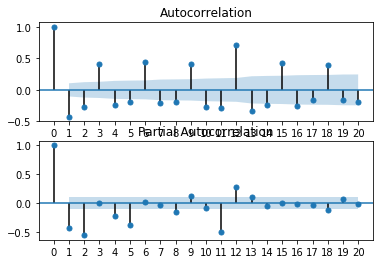

In [8]:
descriptive.plot_acf_pacf(outcome_ts_tr, 20)

### ARIMA Getting best P and Q

In [9]:
arma_order_select_ic(outcome_ts_tr, 3, 3, ic=['aic', 'bic'], trend = 'nc')

{'aic':             0           1           2           3
 0         NaN -334.188569 -332.832467 -352.075900
 1 -207.740693 -332.559168 -340.949986 -354.645513
 2 -336.552841 -347.058904 -363.442171 -438.290861
 3 -334.570210 -362.986568 -369.445162 -446.106035,
 'bic':             0           1           2           3
 0         NaN -326.466996 -321.250108 -336.632755
 1 -200.019121 -320.976810 -325.506841 -335.341582
 2 -324.970482 -331.615759 -344.138240 -415.126144
 3 -319.127065 -343.682637 -346.280445 -419.080532,
 'aic_min_order': (3, 3),
 'bic_min_order': (3, 3)}

In [10]:
pd.date_range(params['pred_start'], params['pred_end'], freq=params['pred_period'])

DatetimeIndex(['2010-01-01', '2010-07-01', '2011-01-01', '2011-07-01',
               '2012-01-01', '2012-07-01', '2013-01-01', '2013-07-01',
               '2014-01-01', '2014-07-01', '2015-01-01', '2015-07-01',
               '2016-01-01', '2016-07-01', '2017-01-01', '2017-07-01',
               '2018-01-01', '2018-07-01', '2019-01-01', '2019-07-01'],
              dtype='datetime64[ns]', freq='6MS')

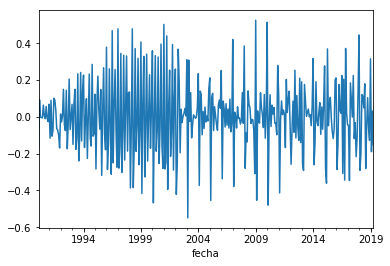

In [11]:
outcome_ts_tr.plot()

ARIMA: order (2, 0, 2), 


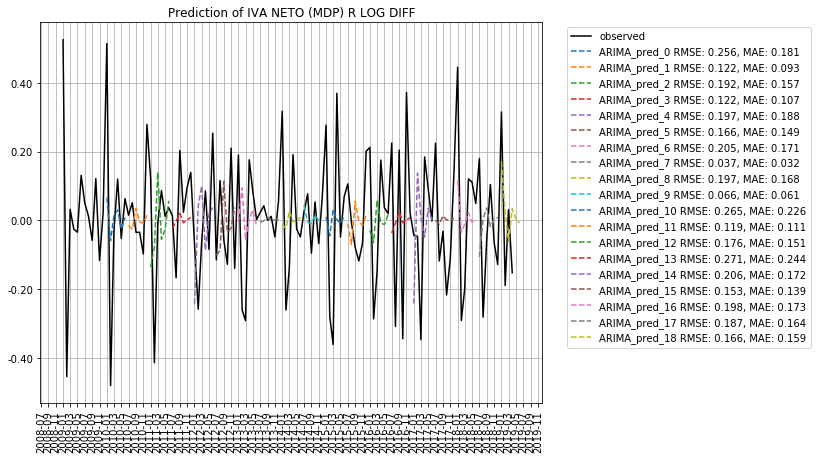

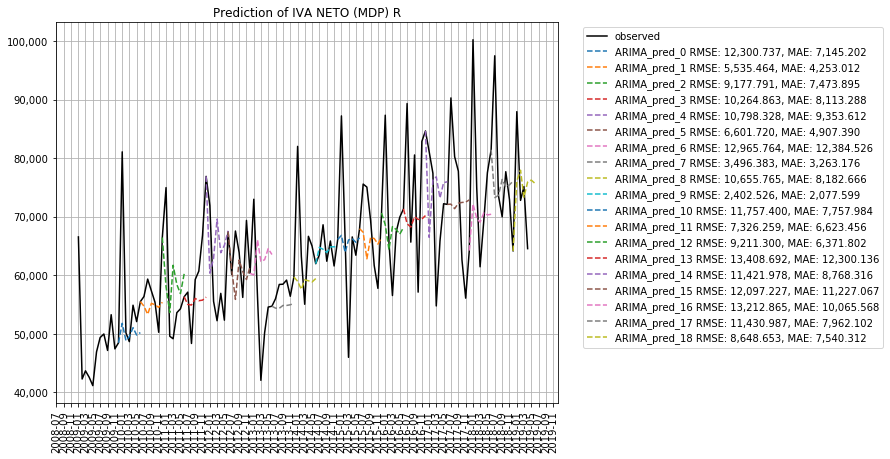

ARIMA: order (2, 0, 3), 


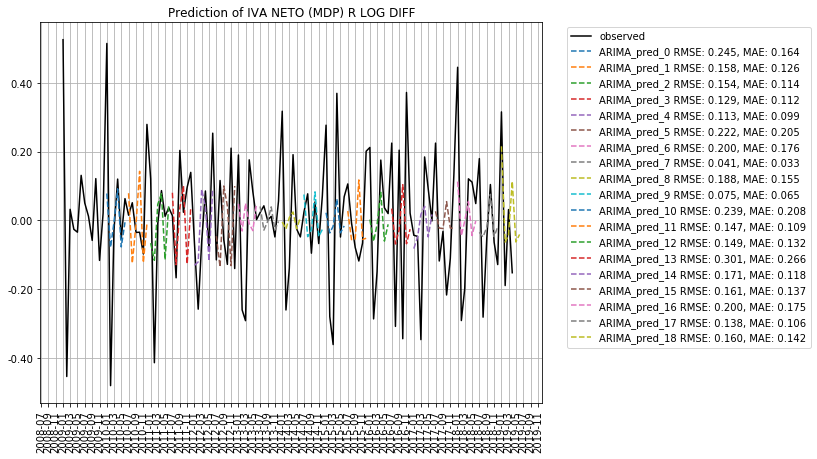

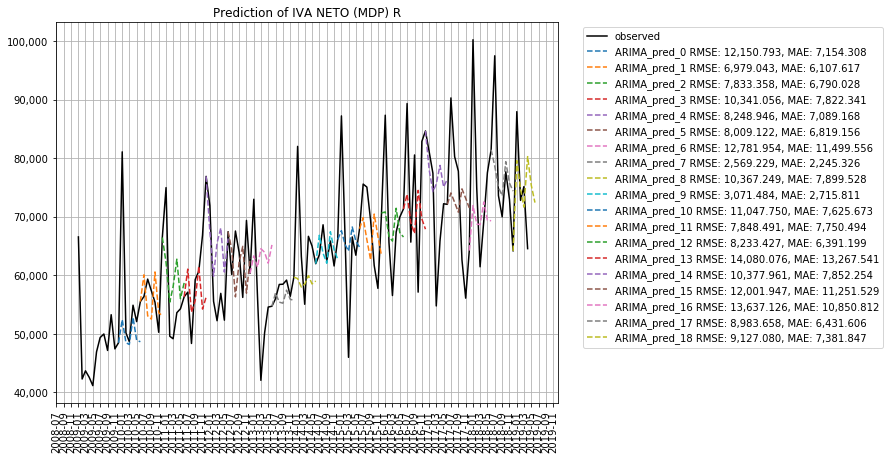

ARIMA: order (3, 0, 2), 


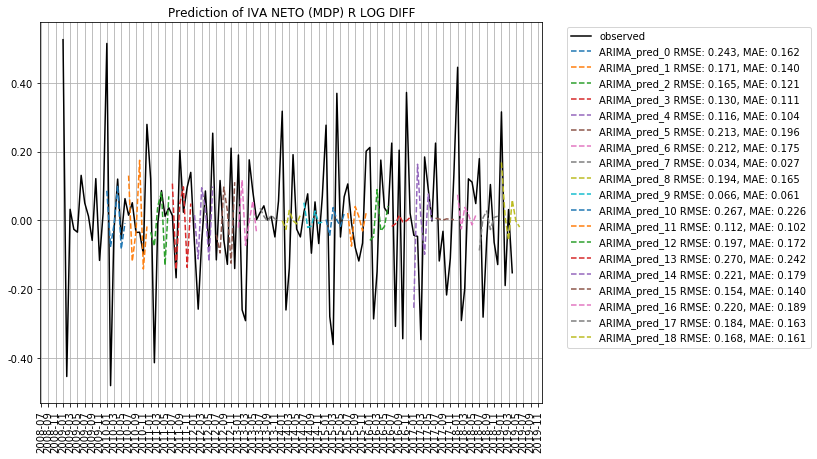

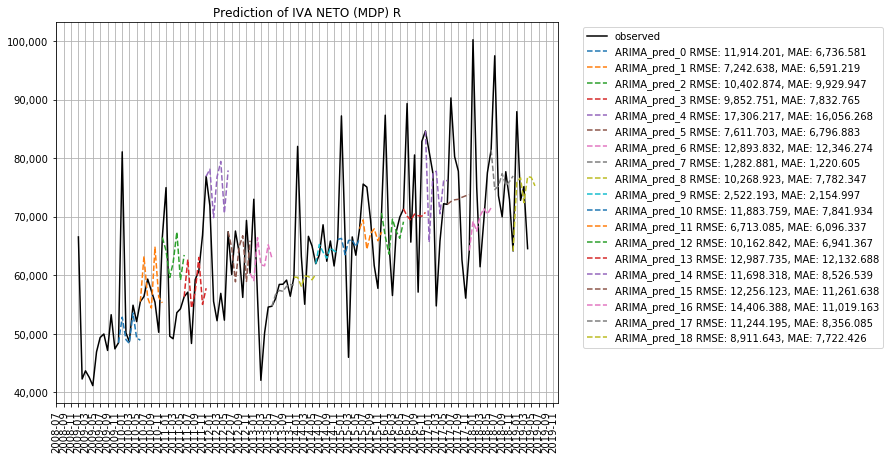

ARIMA: order (3, 0, 3), 


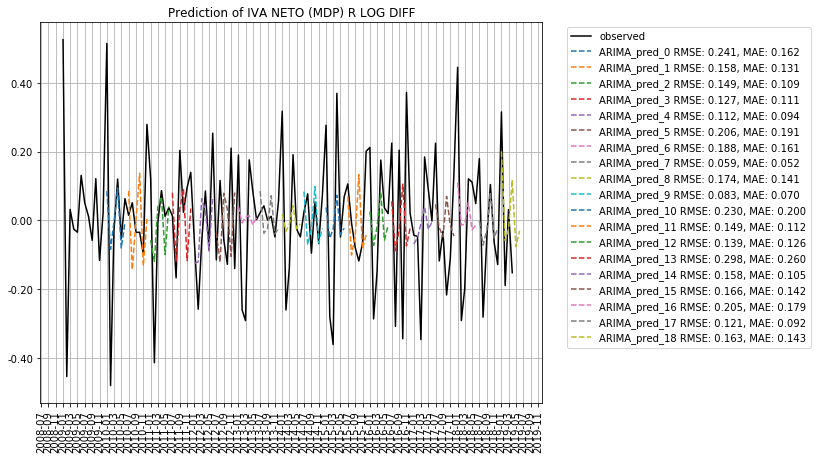

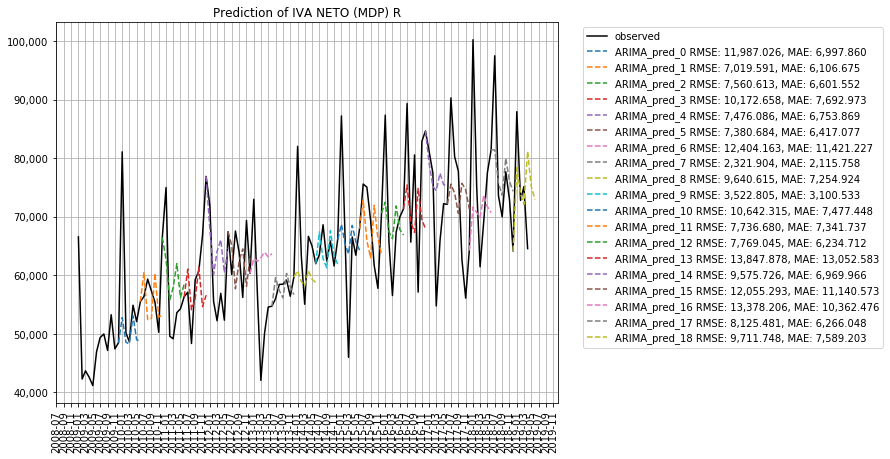

In [12]:
results_arima = models.run_model_joint(model_name='ARIMA', all_models_params=all_models_params,
                                       outcome_var=outcome_ts, global_params=params, plot_extra=True,
                                       outcome_var_tr=outcome_ts_tr)

## SARIMA Getting best P, Q and S

In [13]:
sarima_aic = {'param':[], 'aic':[]}
for param in all_models_params['SARIMA']:
    mod = sm.tsa.statespace.SARIMAX(outcome_ts_tr, **param)
    results = mod.fit(maxiter=200)
    sarima_aic['param'].append(param)
    sarima_aic['aic'].append(results.aic)
sarima_aic = pd.DataFrame(sarima_aic)
sarima_aic = sarima_aic.sort_values('aic')
with pd.option_context("display.max_rows", 999):
    print(sarima_aic.head().values)

[[{'enforce_invertibility': False, 'enforce_stationarity': False, 'order': (3, 0, 3), 'seasonal_order': (1, 0, 1, 12)}
  -520.9396001490662]
 [{'enforce_invertibility': False, 'enforce_stationarity': False, 'order': (2, 0, 3), 'seasonal_order': (1, 0, 1, 12)}
  -516.1060958143275]
 [{'enforce_invertibility': False, 'enforce_stationarity': False, 'order': (3, 0, 2), 'seasonal_order': (1, 0, 1, 12)}
  -512.4204217309435]
 [{'enforce_invertibility': False, 'enforce_stationarity': False, 'order': (2, 0, 2), 'seasonal_order': (1, 0, 1, 12)}
  -508.189452177372]
 [{'enforce_invertibility': False, 'enforce_stationarity': False, 'order': (3, 0, 3), 'seasonal_order': (1, 0, 0, 12)}
  -495.9899694771864]]


SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 2), seasonal_order (0, 0, 0, 12), 


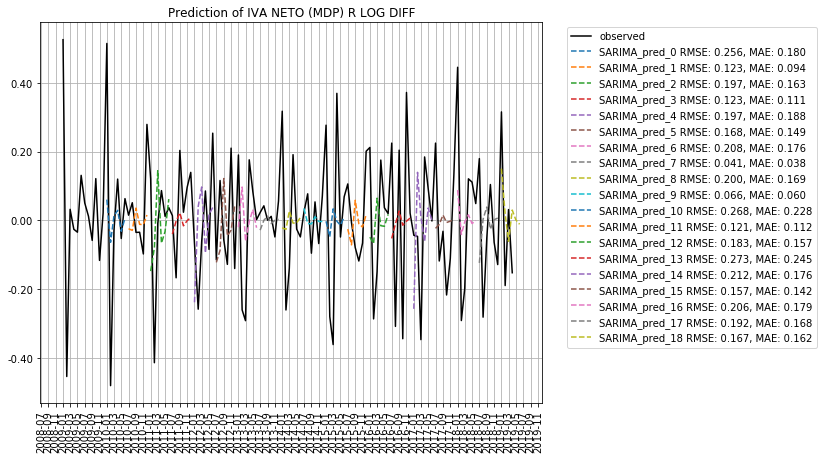

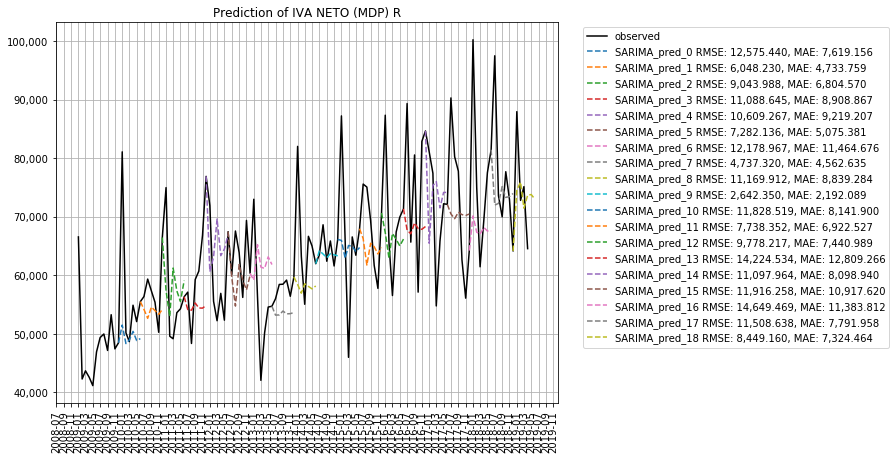

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 2), seasonal_order (0, 0, 1, 12), 


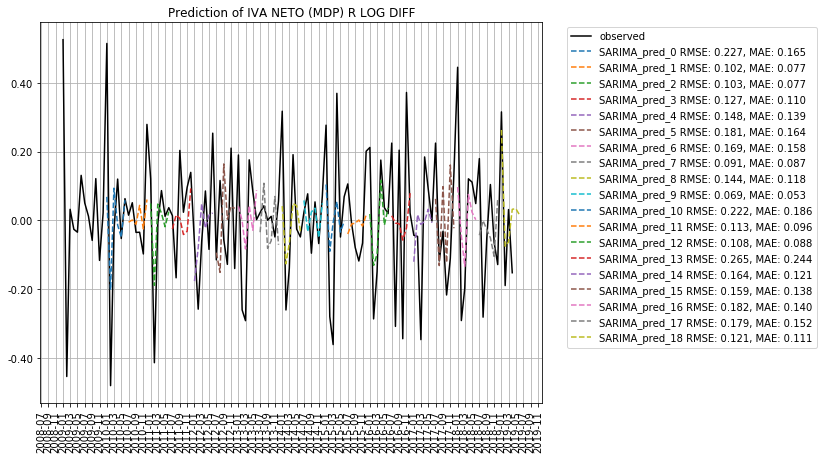

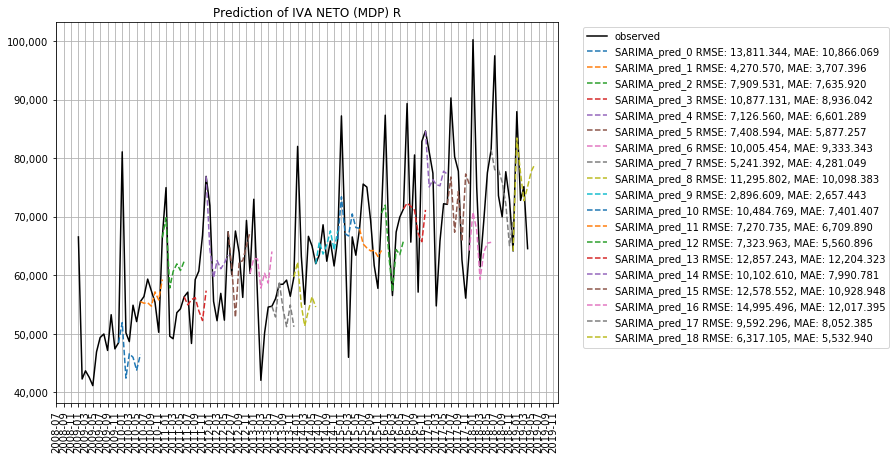

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 2), seasonal_order (1, 0, 0, 12), 


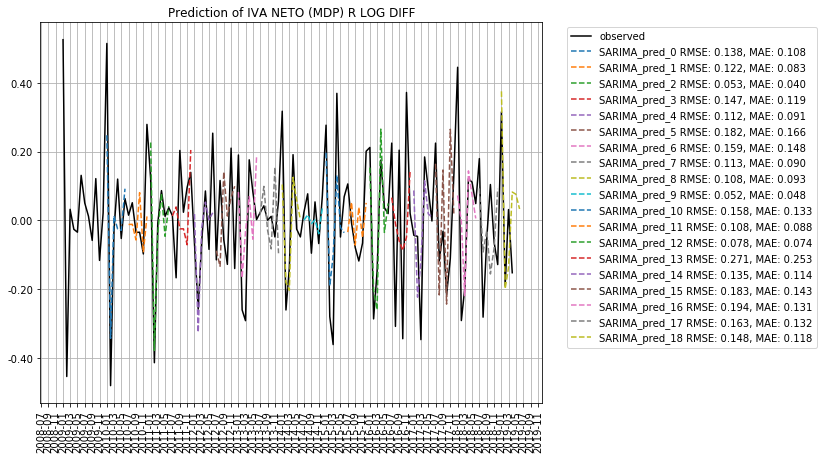

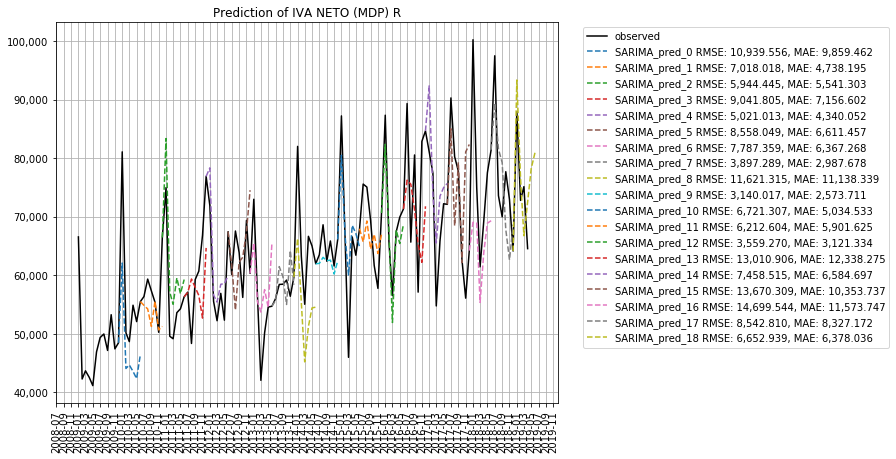

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 2), seasonal_order (1, 0, 1, 12), 


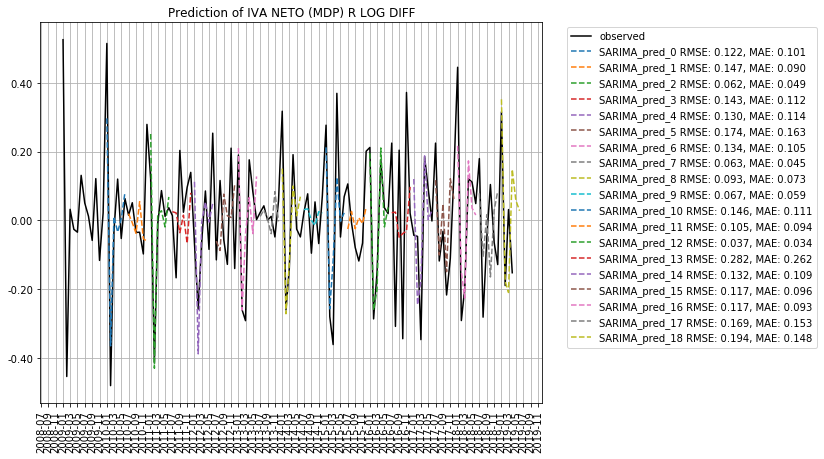

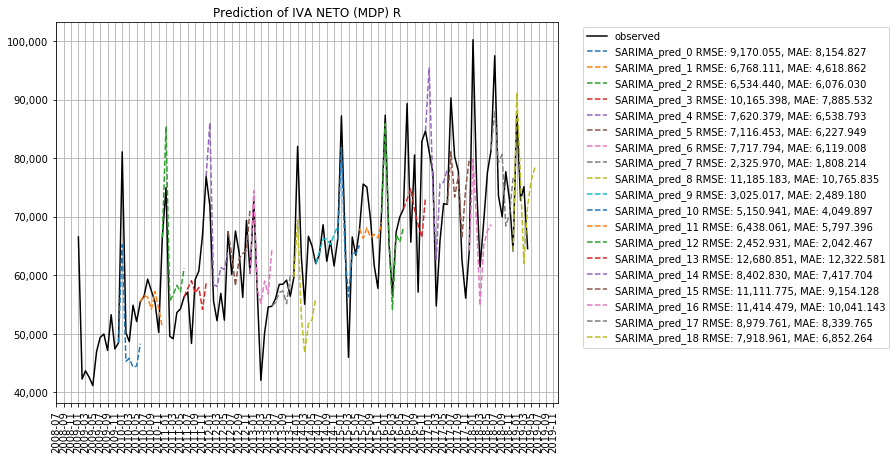

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 3), seasonal_order (0, 0, 0, 12), 


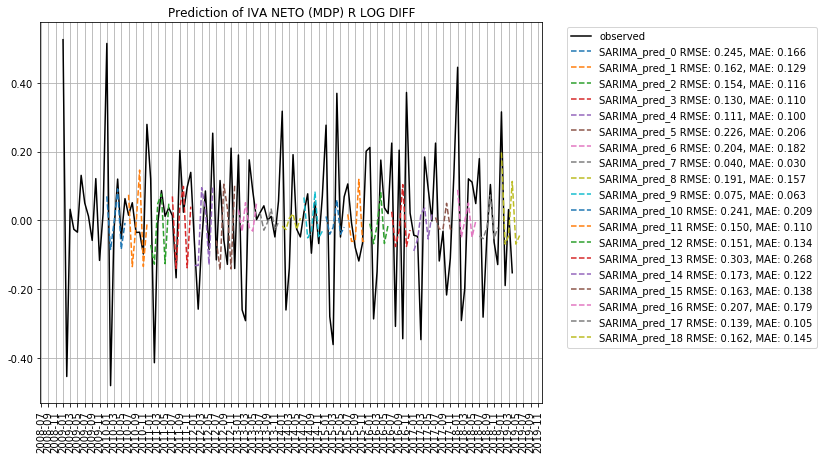

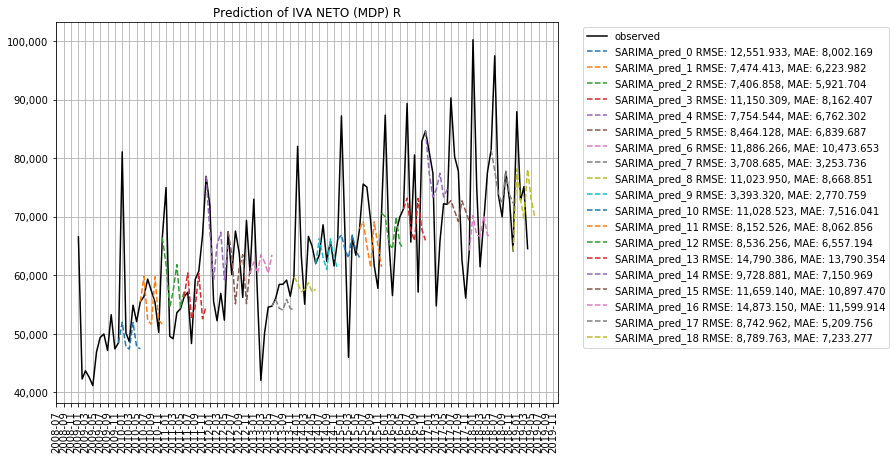

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 3), seasonal_order (0, 0, 1, 12), 


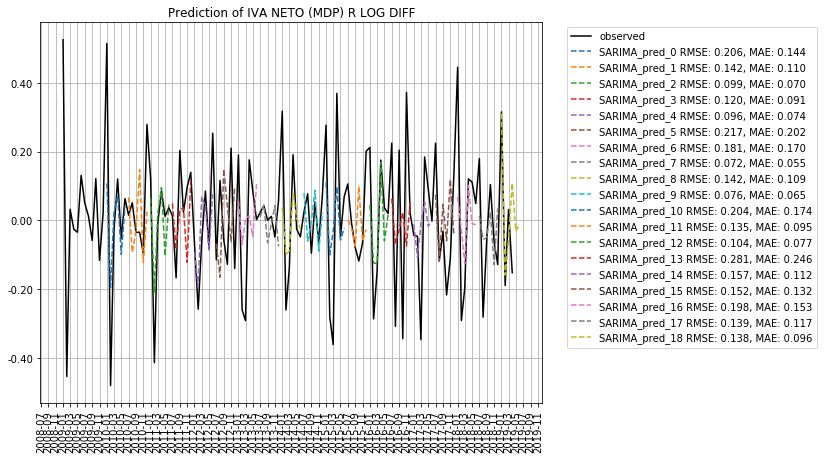

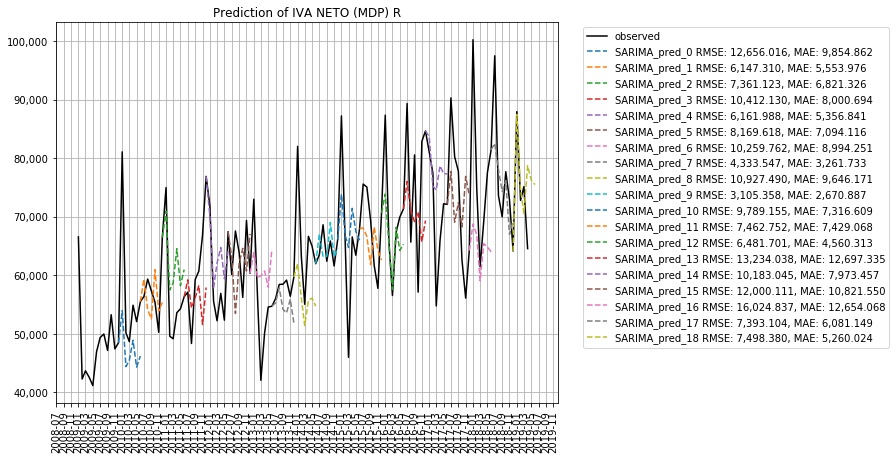

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 3), seasonal_order (1, 0, 0, 12), 


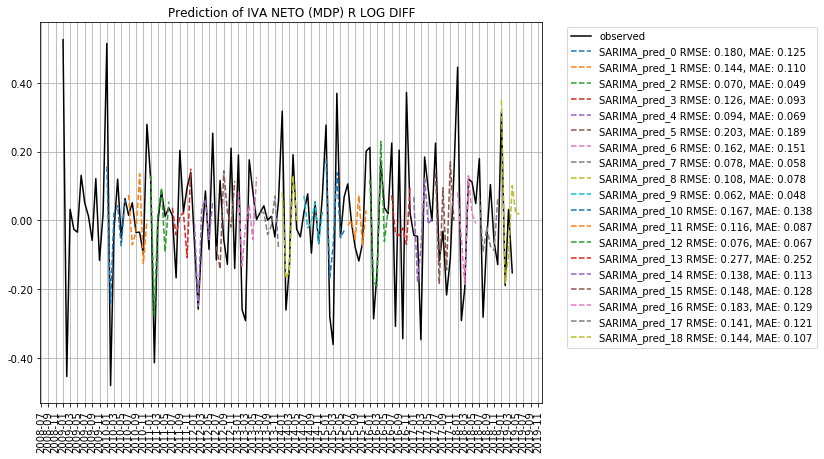

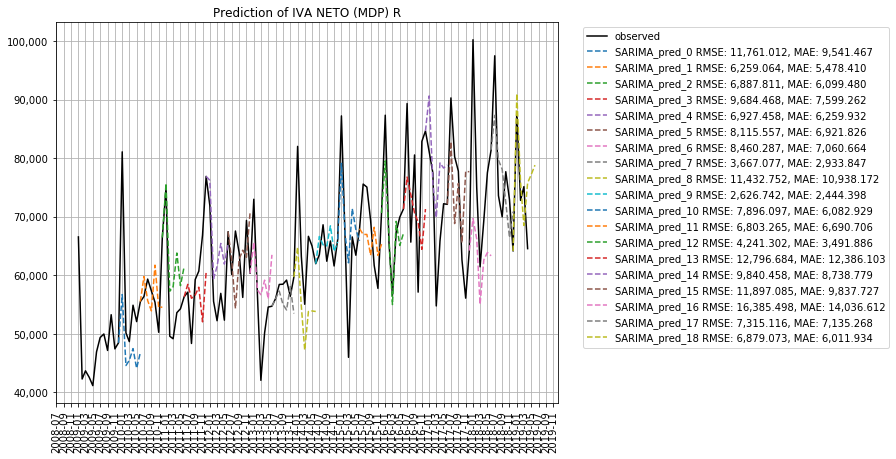

SARIMA: enforce_invertibility False, enforce_stationarity False, order (2, 0, 3), seasonal_order (1, 0, 1, 12), 


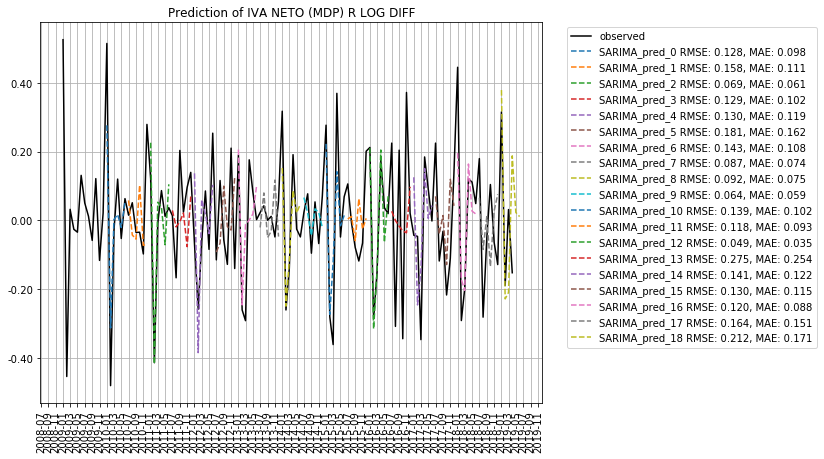

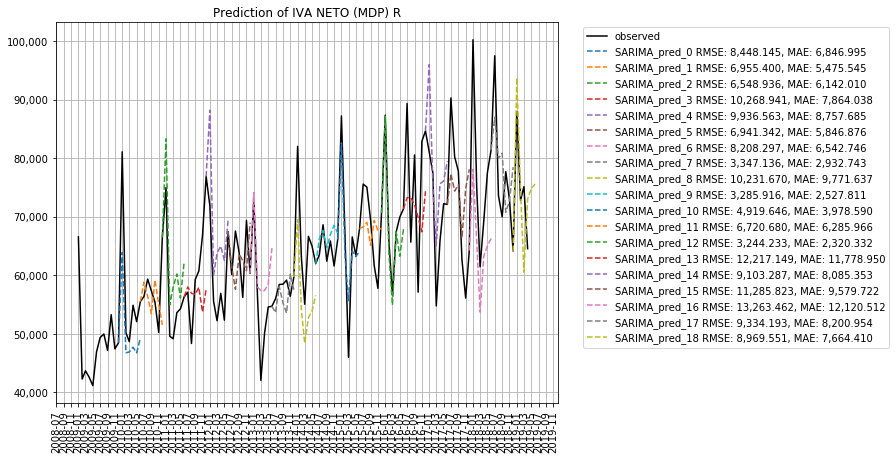

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 2), seasonal_order (0, 0, 0, 12), 


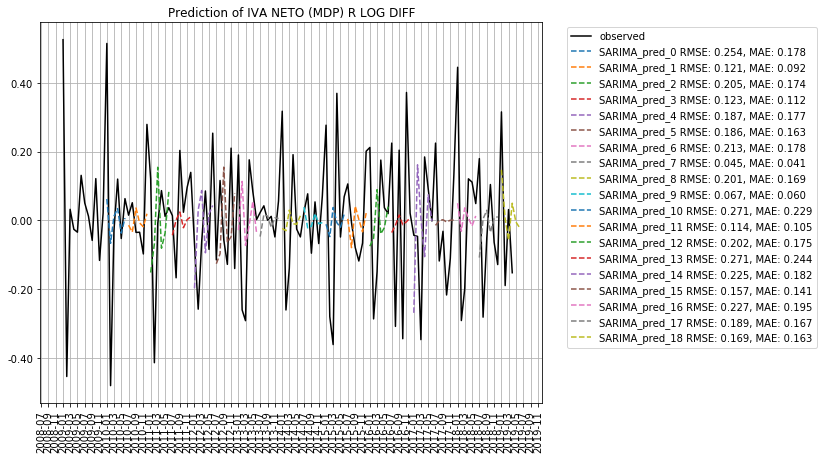

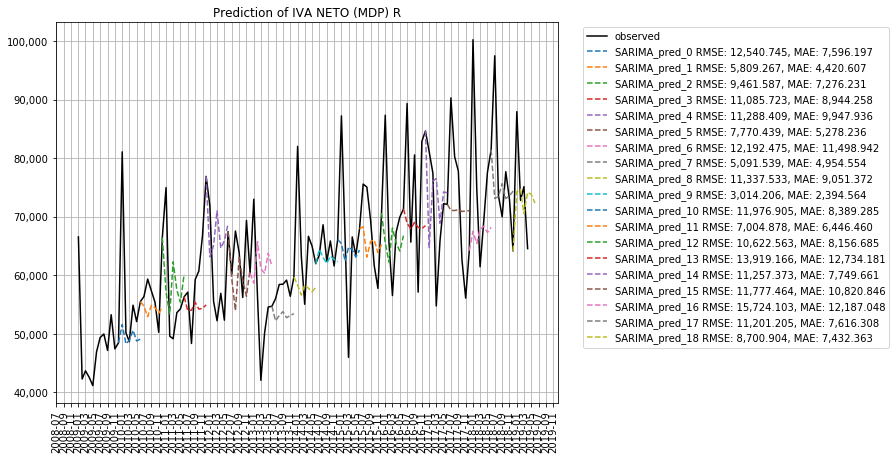

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 2), seasonal_order (0, 0, 1, 12), 


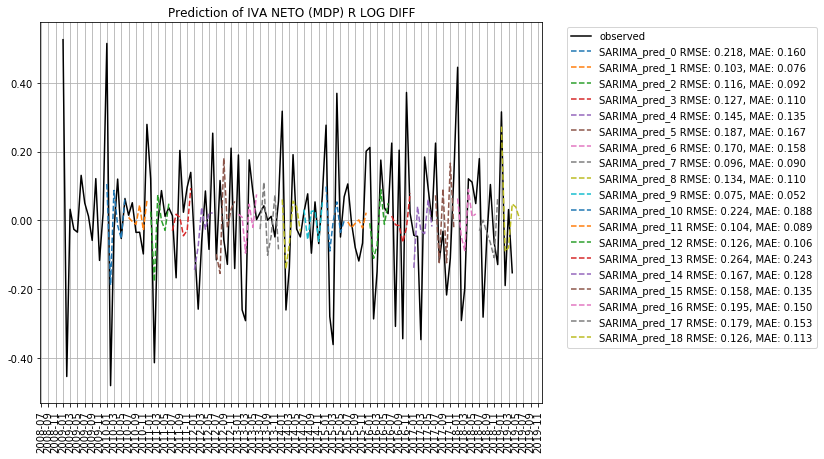

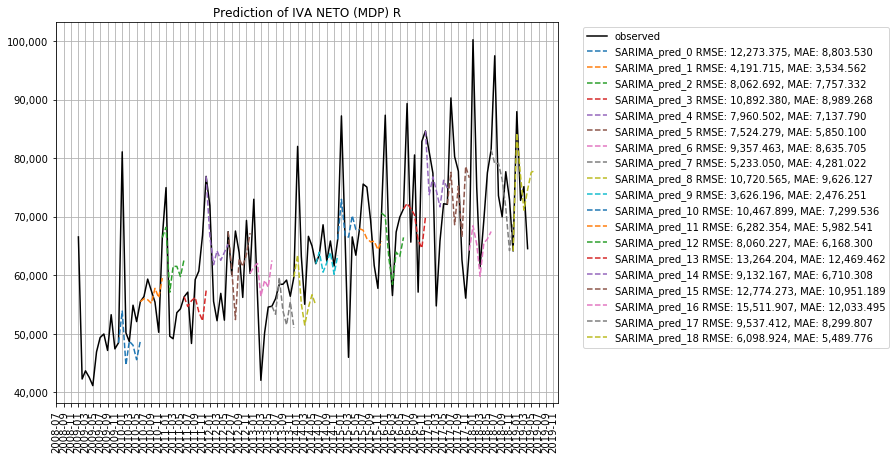

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 2), seasonal_order (1, 0, 0, 12), 


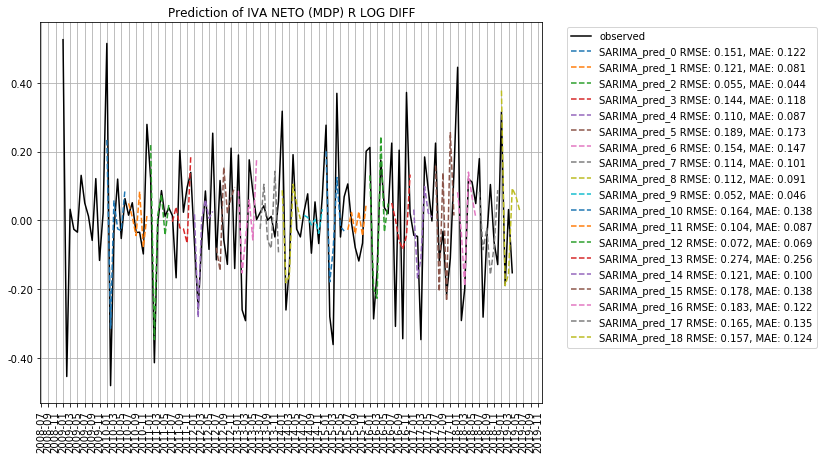

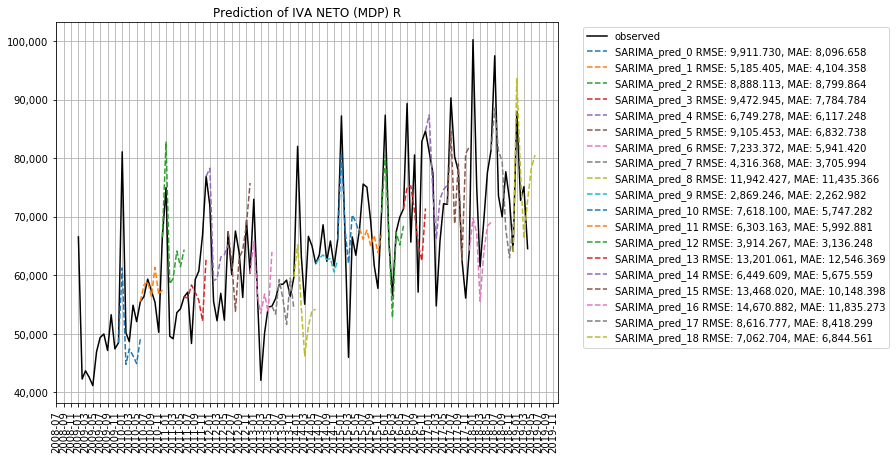

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 2), seasonal_order (1, 0, 1, 12), 


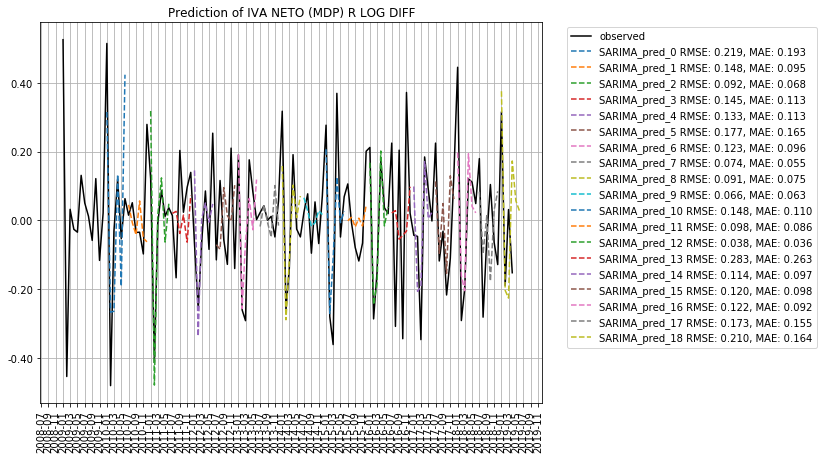

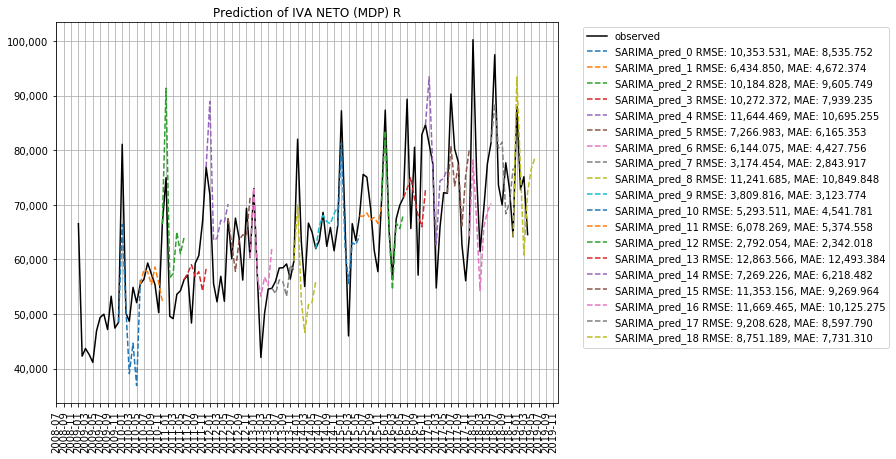

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 3), seasonal_order (0, 0, 0, 12), 


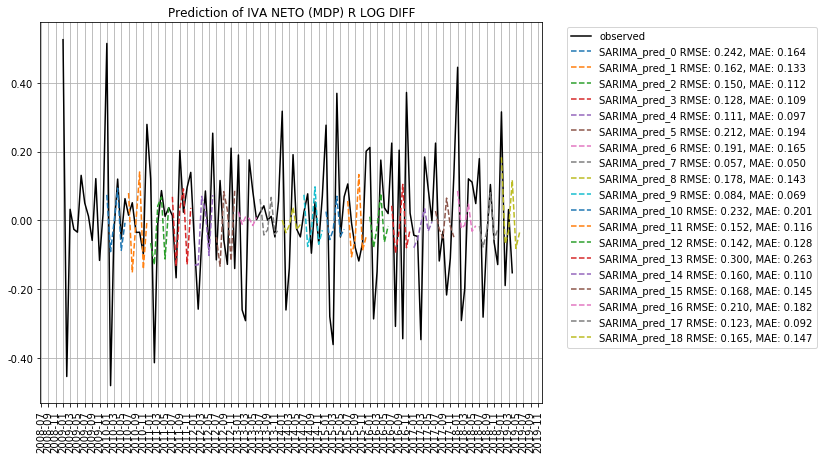

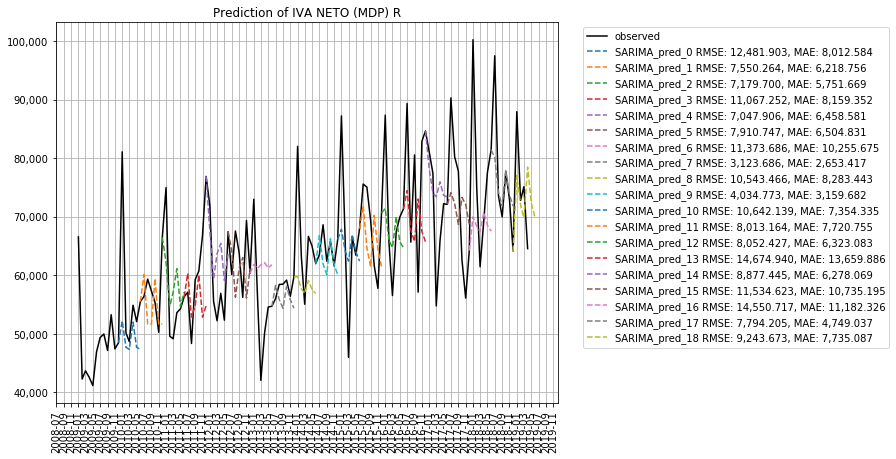

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 3), seasonal_order (0, 0, 1, 12), 


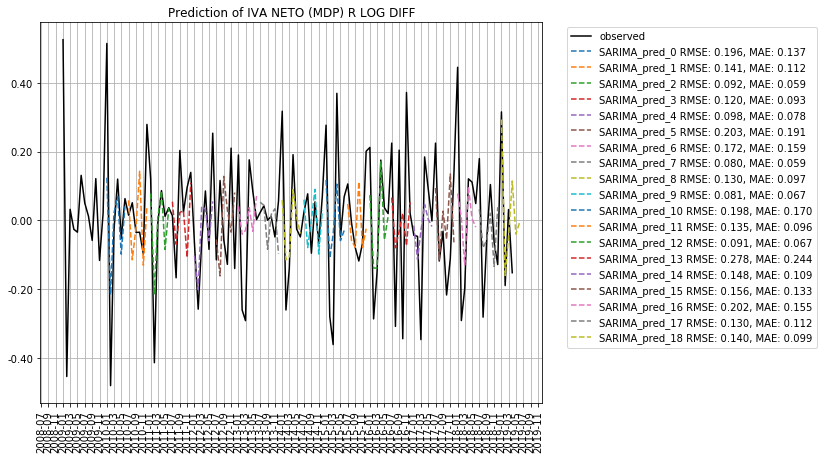

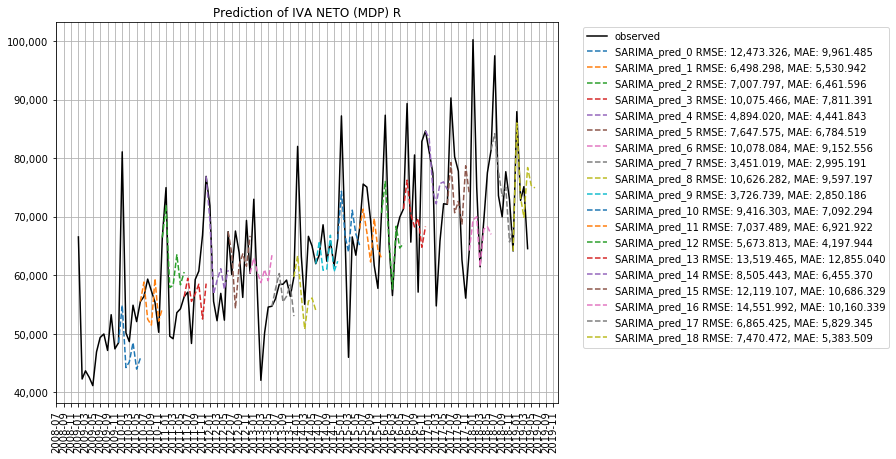

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 3), seasonal_order (1, 0, 0, 12), 


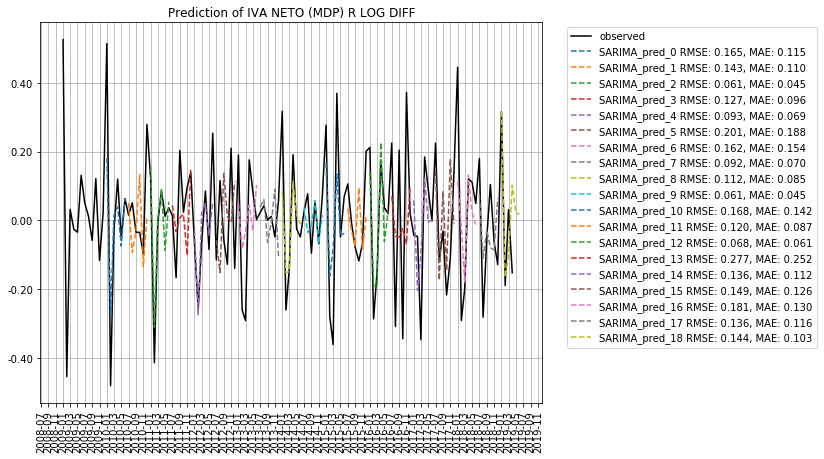

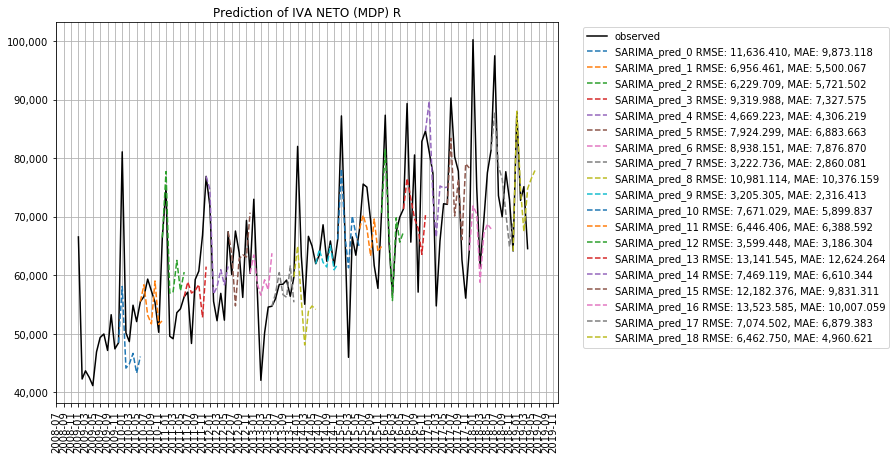

SARIMA: enforce_invertibility False, enforce_stationarity False, order (3, 0, 3), seasonal_order (1, 0, 1, 12), 


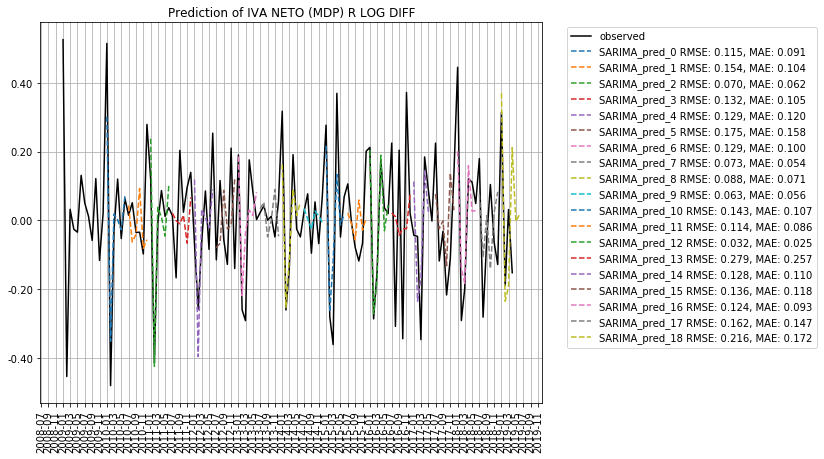

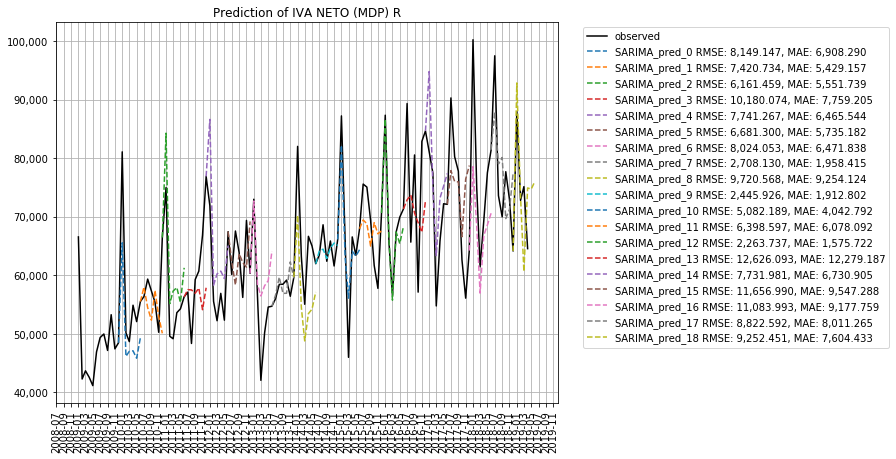

In [14]:
results_sarima = models.run_model_joint(model_name='SARIMA', all_models_params=all_models_params,
                                       outcome_var=outcome_ts, global_params=params, plot_extra=True,
                                       outcome_var_tr=outcome_ts_tr)

# Mechanical
Using PIB and elasticities

Hay diferencias entre datos de do file y estos datos. INPC es diferente. Recaudación y PIB son diferentes en los últimos valores

Las elasticidades de obtuvieron del promedio de elasticidades del último trimestre. (1.1 ISR y 1.3 IVA)

ELASTICITY: elasticity None, lag_window 3, 


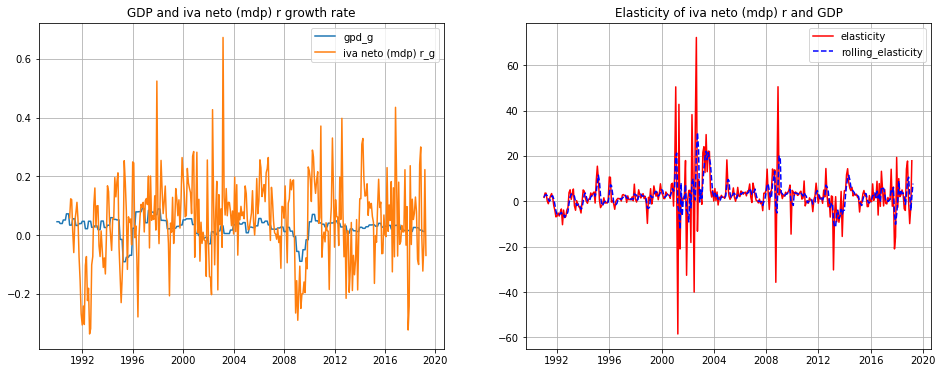

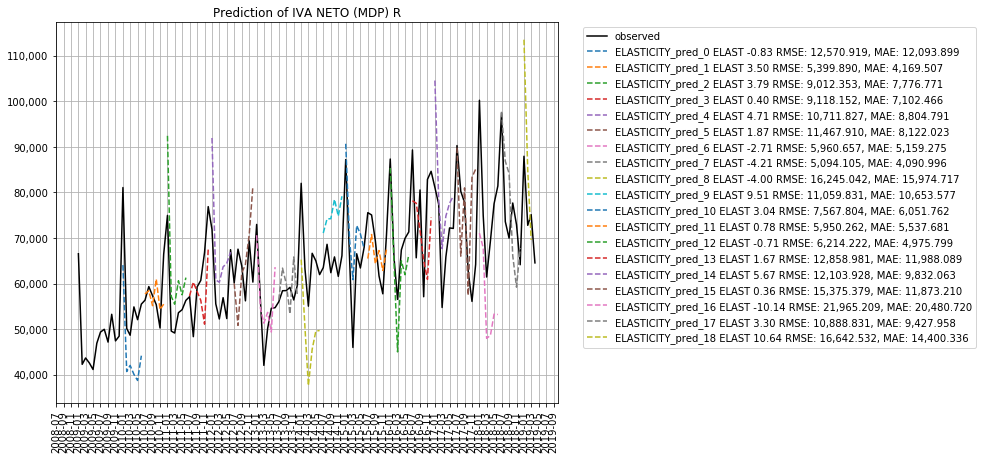

ELASTICITY: elasticity None, lag_window 6, 


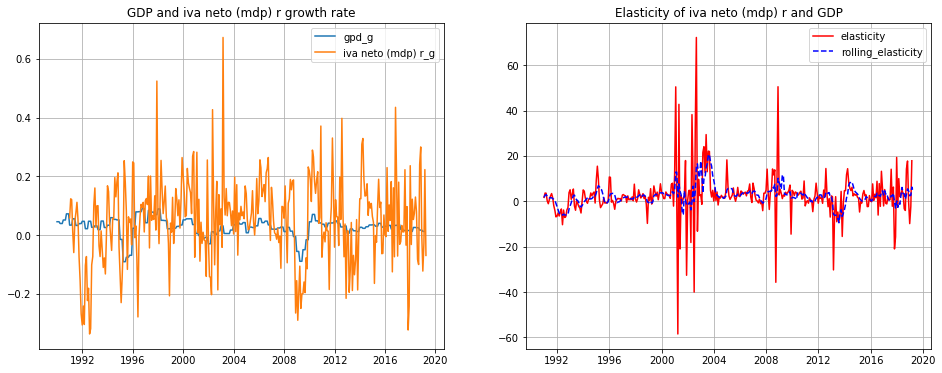

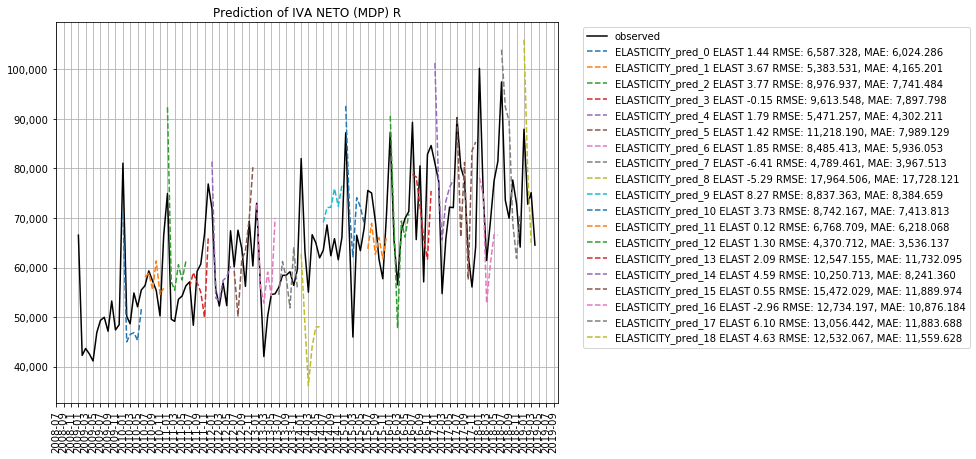

ELASTICITY: elasticity 1.3, lag_window 3, 


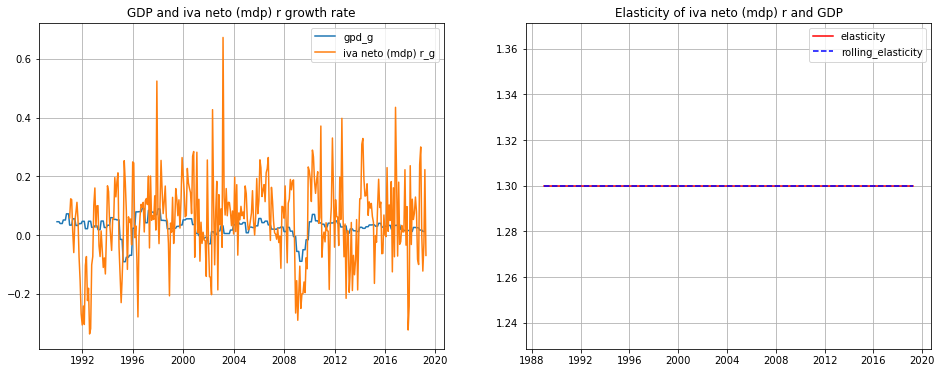

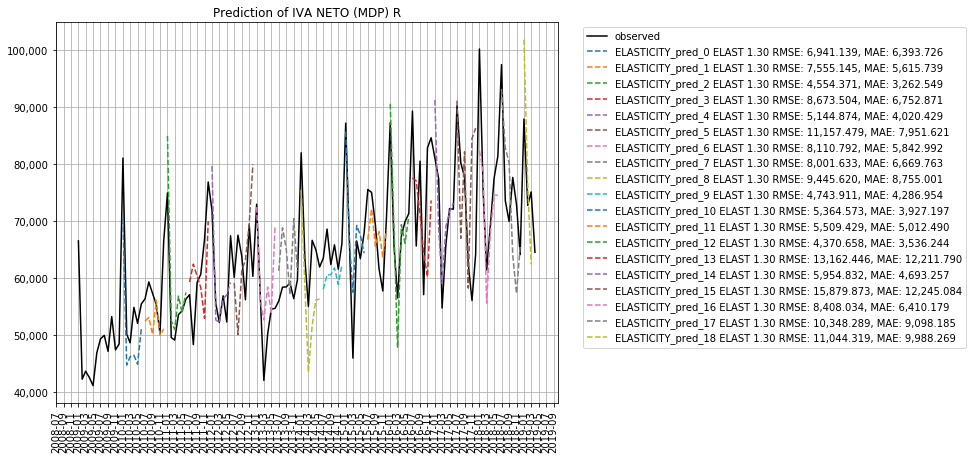

ELASTICITY: elasticity 1.3, lag_window 6, 


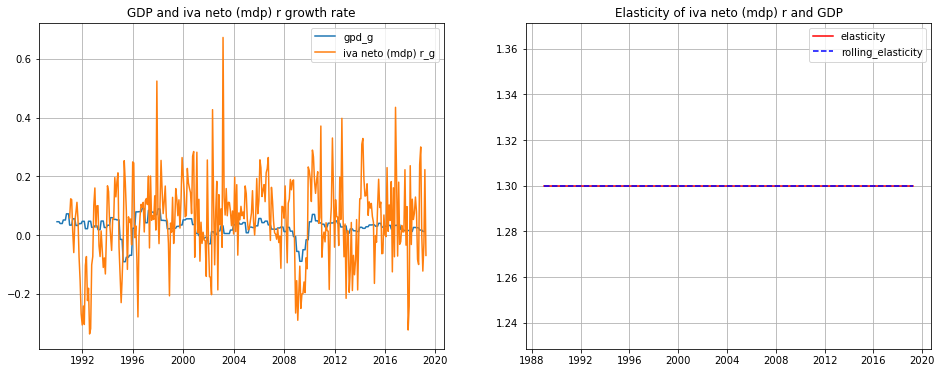

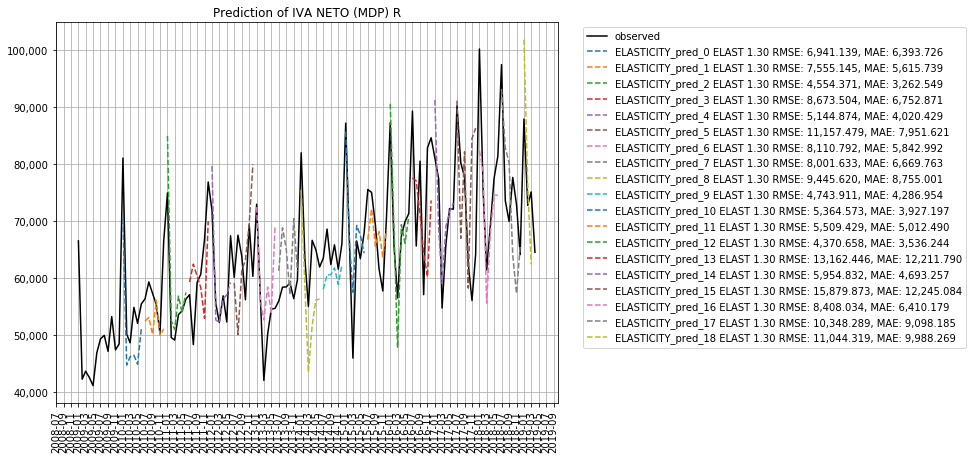

In [15]:
results_elasticity = models.run_model_joint(model_name='ELASTICITY', all_models_params=all_models_params,
                                            outcome_var=outcome_ts, global_params=params, plot_extra=True,
                                            covars=pib_r_2013)

# Facebook Prophet

PROPHET: daily_seasonality False, seasonality_mode additive, weekly_seasonality False, 


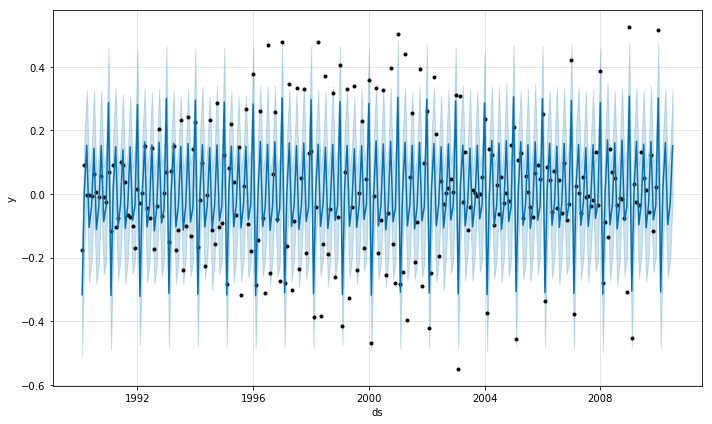

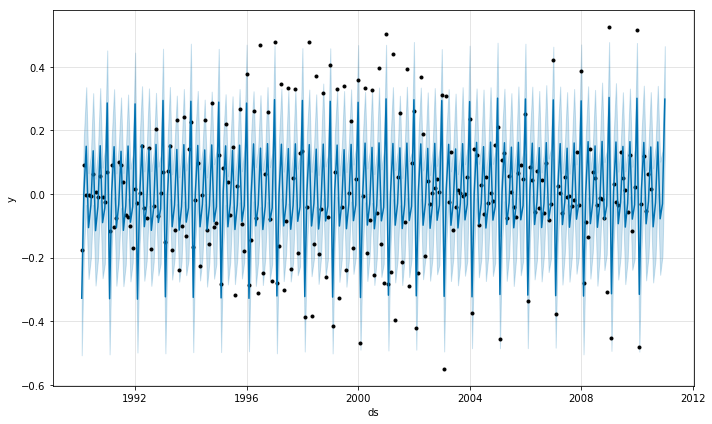

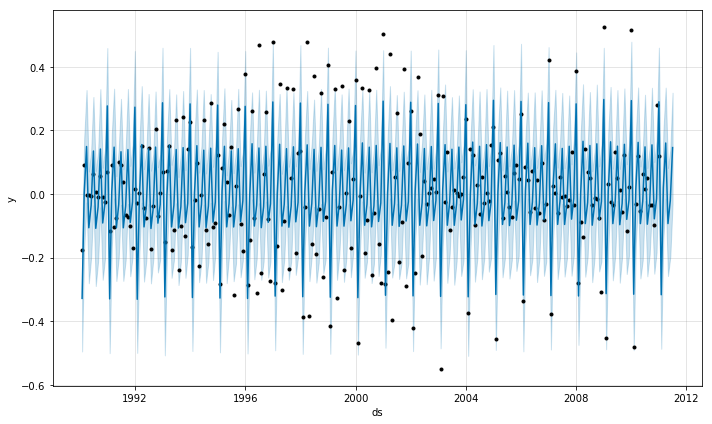

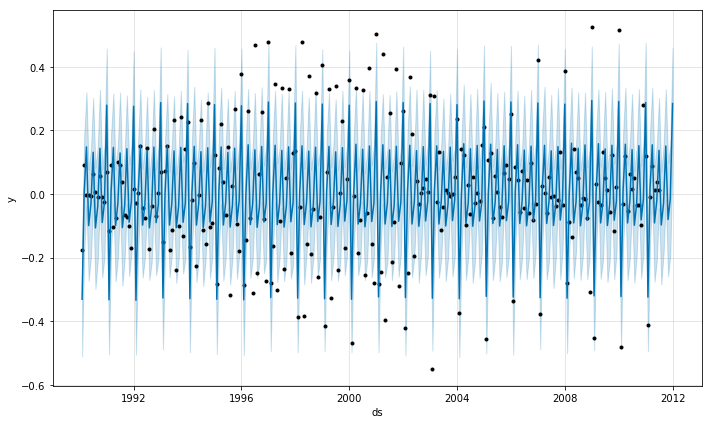

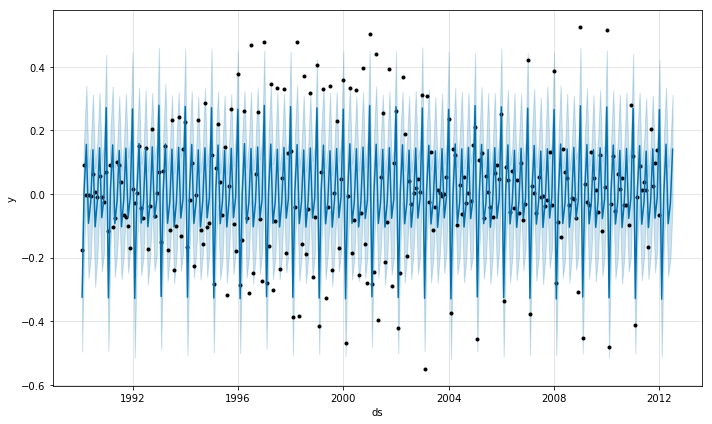

...

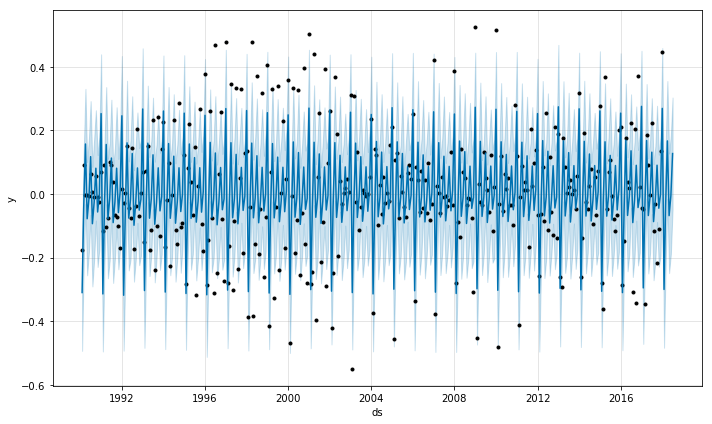

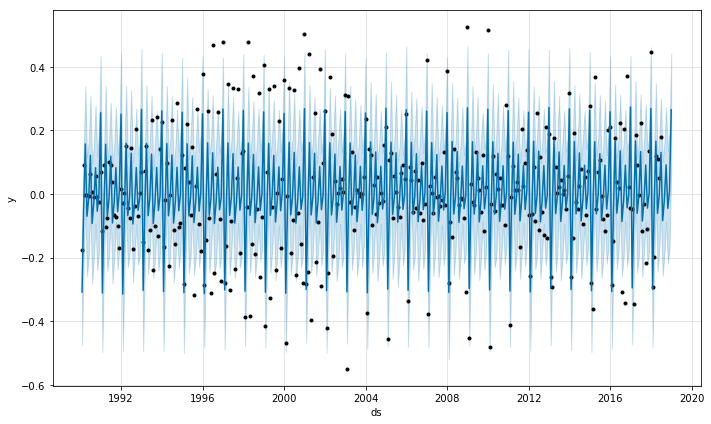

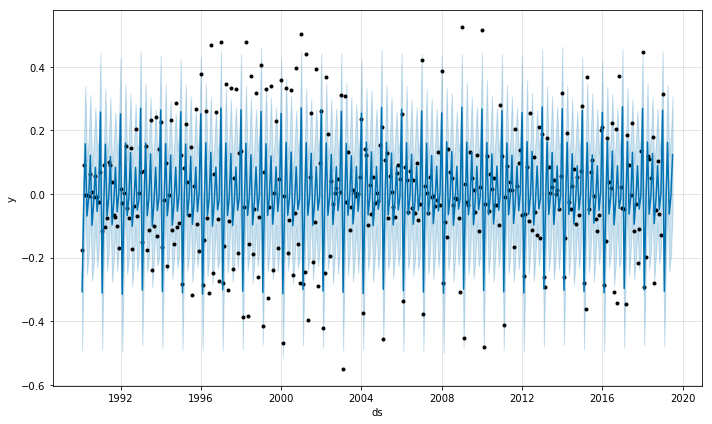

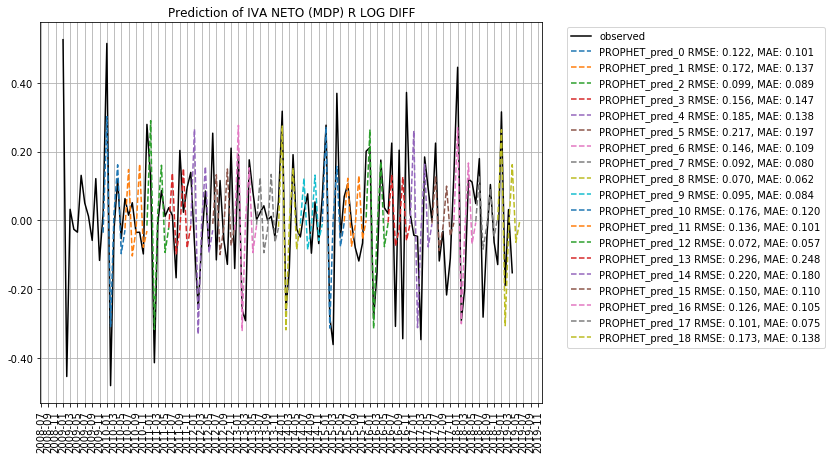

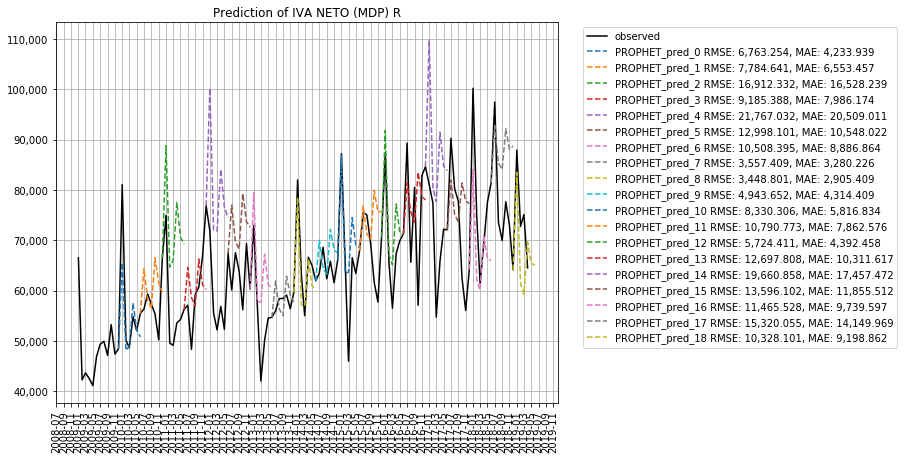

PROPHET: daily_seasonality False, seasonality_mode multiplicative, weekly_seasonality False, 


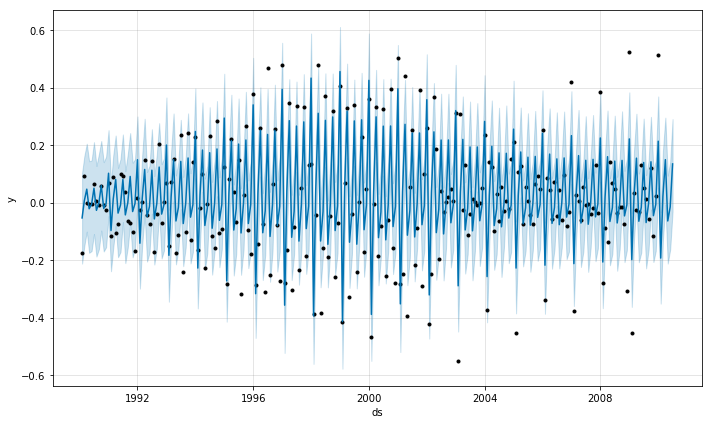

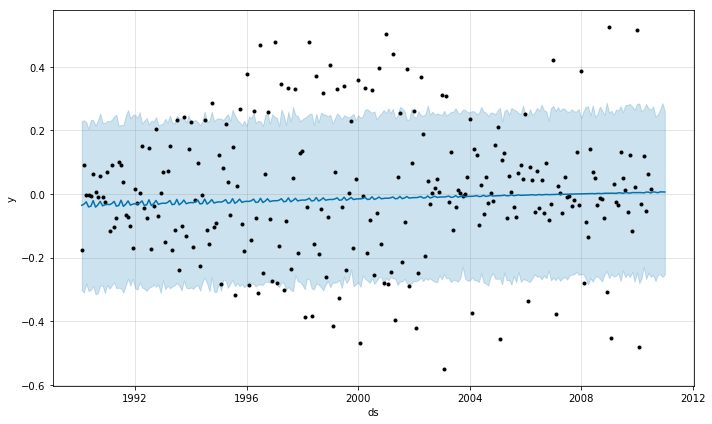

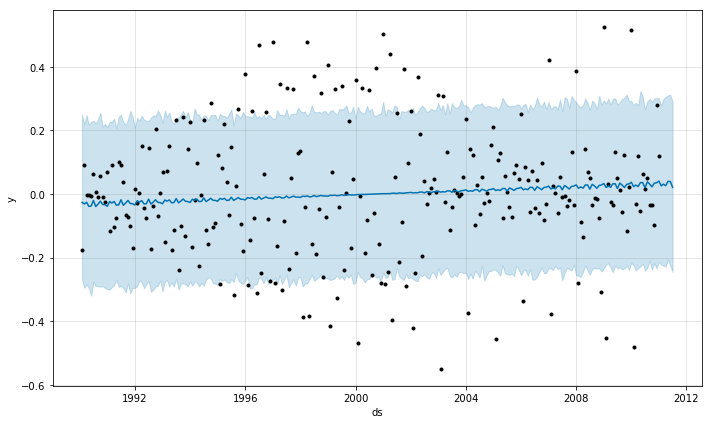

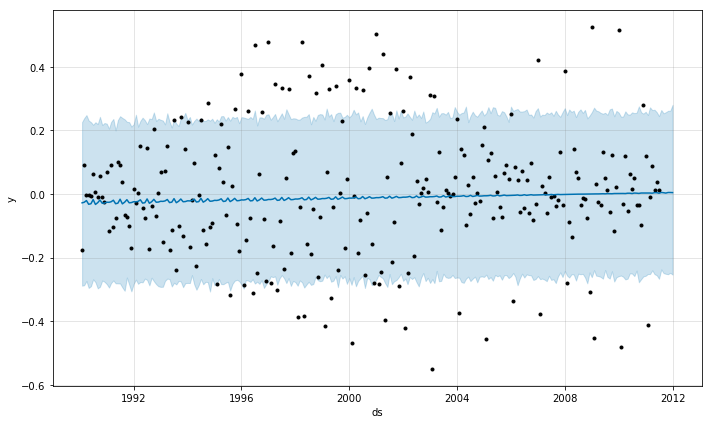

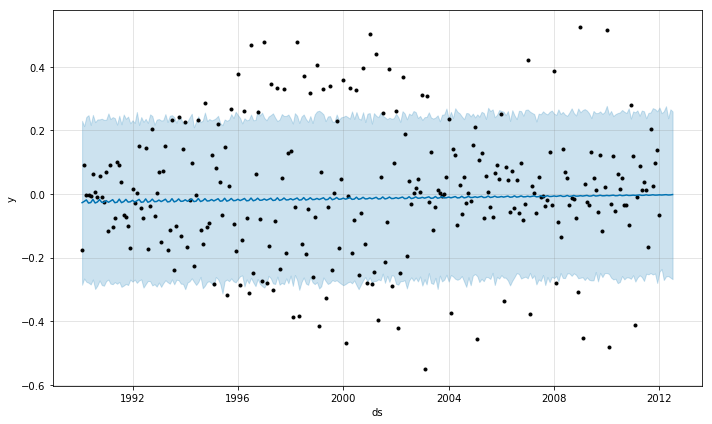

...

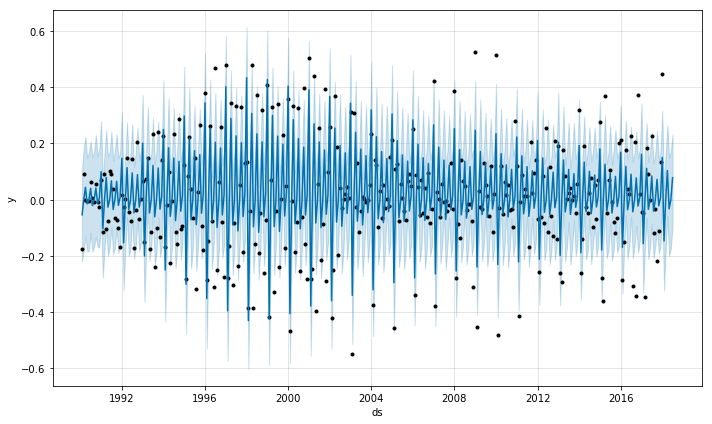

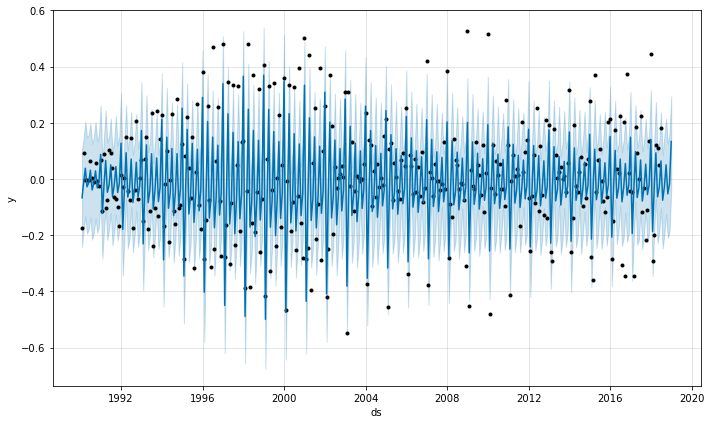

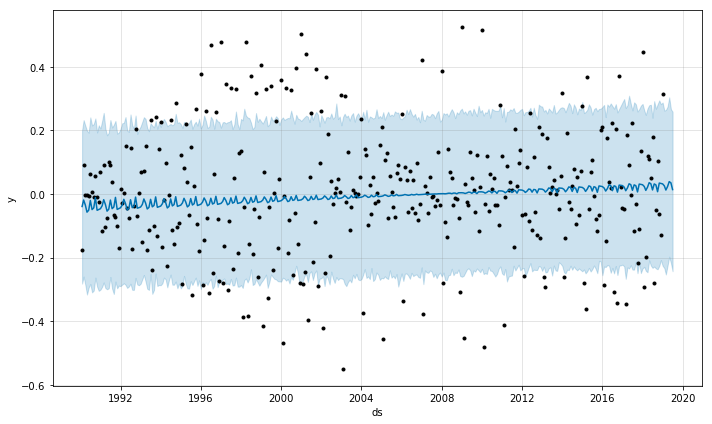

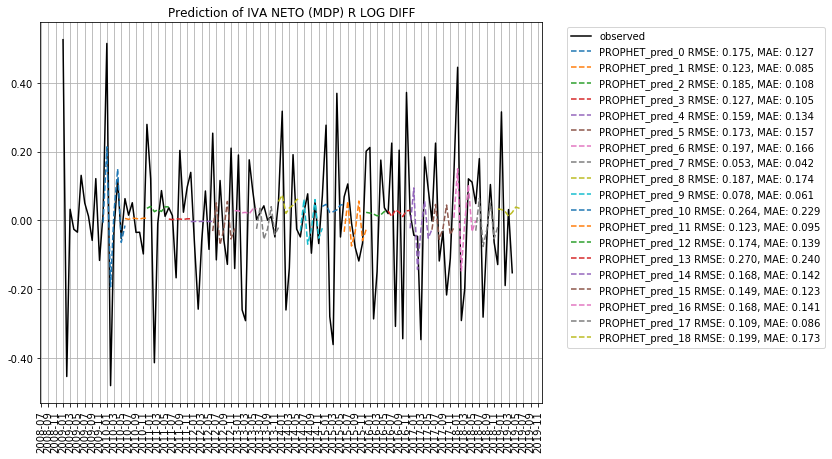

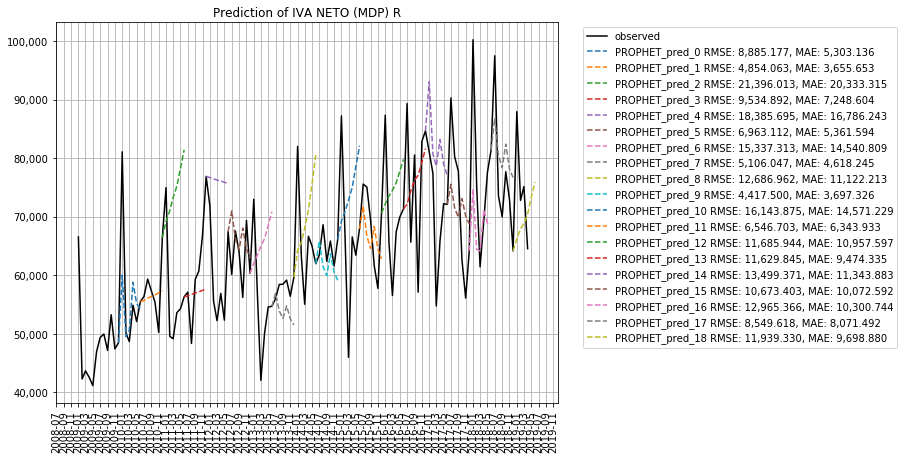

In [16]:
results_prophet = models.run_model_joint(model_name='PROPHET', all_models_params=all_models_params,
                                        outcome_var=outcome_ts, global_params=params, plot_extra=True,
                                        outcome_var_tr=outcome_ts_tr)

# Results Analysis

In [17]:
results_arima_df = pd.DataFrame(results_arima)
results_sarima_df = pd.DataFrame(results_sarima)
results_elasticity_df = pd.DataFrame(results_elasticity)
results_prophet_df = pd.DataFrame(results_prophet)
results = pd.concat([results_arima_df, results_sarima_df, results_elasticity_df, results_prophet_df])
col_order = ['model', 'param', 'transformation', 'split_date', 'pred_period', 'dynamic', 'rmse', 'mae']
results = results[col_order]

In [18]:
results.isna().any()

model             False
param             False
transformation    False
split_date         True
pred_period        True
dynamic            True
rmse              False
mae               False
dtype: bool

In [19]:
results_log_diff = results.loc[(results['split_date'].notna()) & (results['transformation'] == 'log_diff')]

In [20]:
results_levels = results.loc[(results['split_date'].notna()) & (results['transformation'] == 'levels')]

In [21]:
summary = pd.pivot_table(results_log_diff,
                         index=['model', 'split_date'],
                         aggfunc='min',
                         fill_value=0)

In [22]:
summary = summary.reset_index()

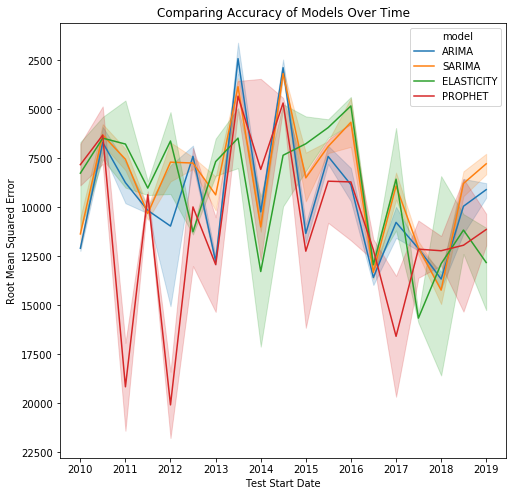

In [23]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(8,8))
sns.lineplot(x="split_date", y="rmse", hue="model",
             data=results_levels, ax=ax)
ax.invert_yaxis()
ax.set_xlabel("Test Start Date")
ax.set_ylabel("Root Mean Squared Error")
ax.set_title("Comparing Accuracy of Models Over Time")
plt.show()

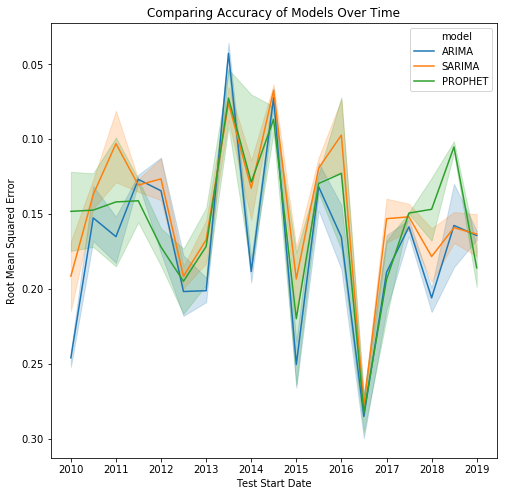

In [24]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(8,8))
sns.lineplot(x="split_date", y="rmse", hue="model",
             data=results_log_diff, ax=ax)
ax.invert_yaxis()
ax.set_xlabel("Test Start Date")
ax.set_ylabel("Root Mean Squared Error")
ax.set_title("Comparing Accuracy of Models Over Time")
plt.show()

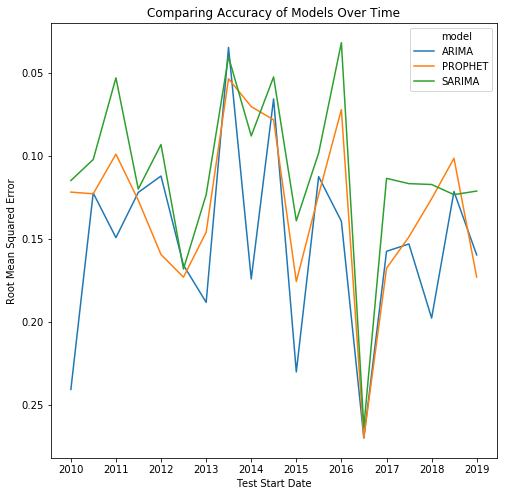

In [25]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(8,8))
sns.lineplot(x="split_date", y="rmse", hue="model",
             data=summary, ax=ax)
ax.invert_yaxis()
ax.set_xlabel("Test Start Date")
ax.set_ylabel("Root Mean Squared Error")
ax.set_title("Comparing Accuracy of Models Over Time")
plt.show()